In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *

In [2]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['SAMPLE'] = anotation['3-Illumina_ID']
ids_hg19['REGION'] = anotation['10-Region']
ids_hg19['COUNTRY'] = anotation['11-Country']

In [3]:
####Results from chm13_data_gene_regions.py  
## Output is called in the next cell


In [4]:
chm13 = pd.read_csv('/Users/luciabazan/Downloads/chm13_gene_regions.csv', index_col=0)
chm13['LENGHT'] = chm13['END'] - chm13['START']
chm13 = chm13.drop(columns=['START_GENE', 'END_GENE'])
chm13 = chm13.drop_duplicates()
chm13#['TYPE'].value_counts()

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
0,LP6005441-DNA_B02,chrX,105118,116978,1,DELETION,11860
18,LP6005441-DNA_B02,chrX,1038532,1048096,1,DELETION,9564
21,LP6005441-DNA_B02,chrX,1193541,1202443,1,DELETION,8902
24,LP6005441-DNA_B02,chrX,1296349,1304923,1,DELETION,8574
26,LP6005441-DNA_B02,chrX,1855267,1863572,1,DELETION,8305
...,...,...,...,...,...,...,...
1874421,LP6005442-DNA_H01,chr1,247606647,247620901,5,DUPLICATION,14254
1874427,LP6005442-DNA_H01,chr1,247629795,247637933,4,DUPLICATION,8138
1874430,LP6005442-DNA_H01,chr1,247738073,247750886,6,DUPLICATION,12813
1874432,LP6005442-DNA_H01,chr1,247954331,247967419,4,DUPLICATION,13088


In [5]:
## Filter by chromosomes
data_x = chm13[chm13.CHR == 'chrX']
data_no_sex_chr = chm13[chm13.CHR != 'chrY']
data_no_sex_chr = data_no_sex_chr[data_no_sex_chr.CHR != 'chrX']

data_no_sex_chr

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
165,LP6005441-DNA_B02,chr22,18805936,18816025,1,DELETION,10089
166,LP6005441-DNA_B02,chr22,25035009,25045165,1,DELETION,10156
170,LP6005441-DNA_B02,chr22,25234701,25242766,1,DELETION,8065
176,LP6005441-DNA_B02,chr22,32151736,32167381,1,DELETION,15645
178,LP6005441-DNA_B02,chr22,33010661,33020973,1,DELETION,10312
...,...,...,...,...,...,...,...
1874421,LP6005442-DNA_H01,chr1,247606647,247620901,5,DUPLICATION,14254
1874427,LP6005442-DNA_H01,chr1,247629795,247637933,4,DUPLICATION,8138
1874430,LP6005442-DNA_H01,chr1,247738073,247750886,6,DUPLICATION,12813
1874432,LP6005442-DNA_H01,chr1,247954331,247967419,4,DUPLICATION,13088


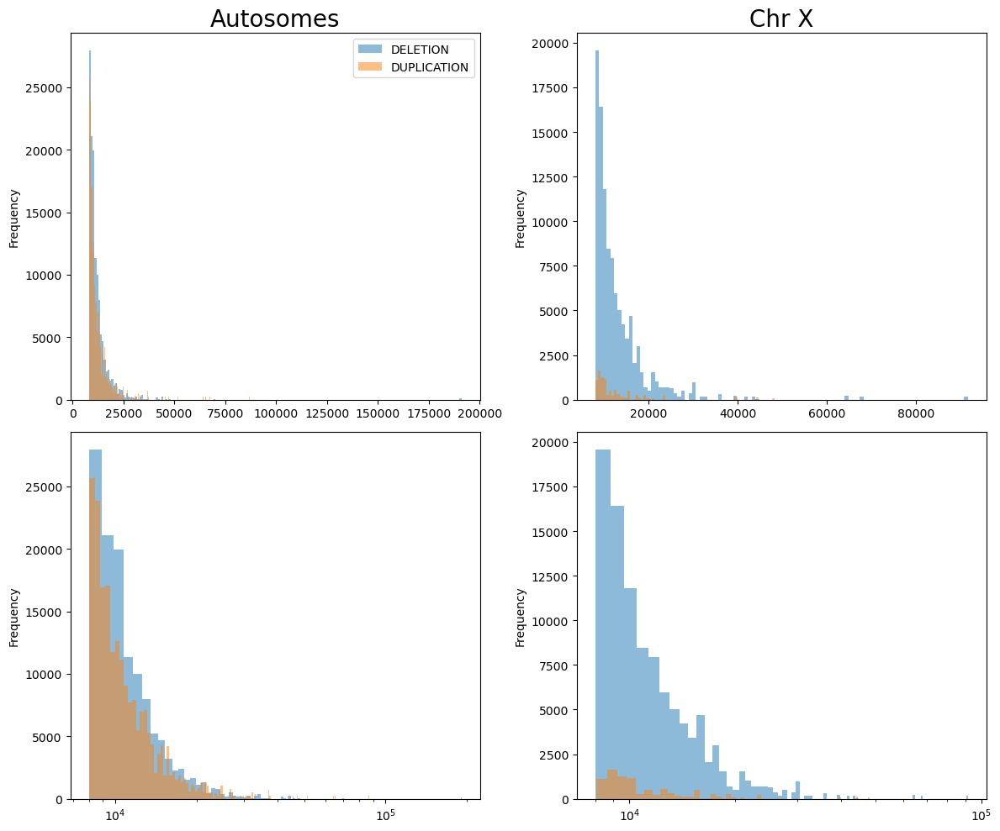

In [6]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df1 = data_no_sex_chr.groupby(['TYPE'])['LENGHT']

df1.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df2 = data_no_sex_chr.groupby(['TYPE'])['LENGHT']

df2.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df3 = data_x.groupby(['TYPE'])['LENGHT']

df3.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df4 = data_x.groupby(['TYPE'])['LENGHT']

df4.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
plt.savefig('../plots/distribution_chm13.png', transparent=True)
plt.show()

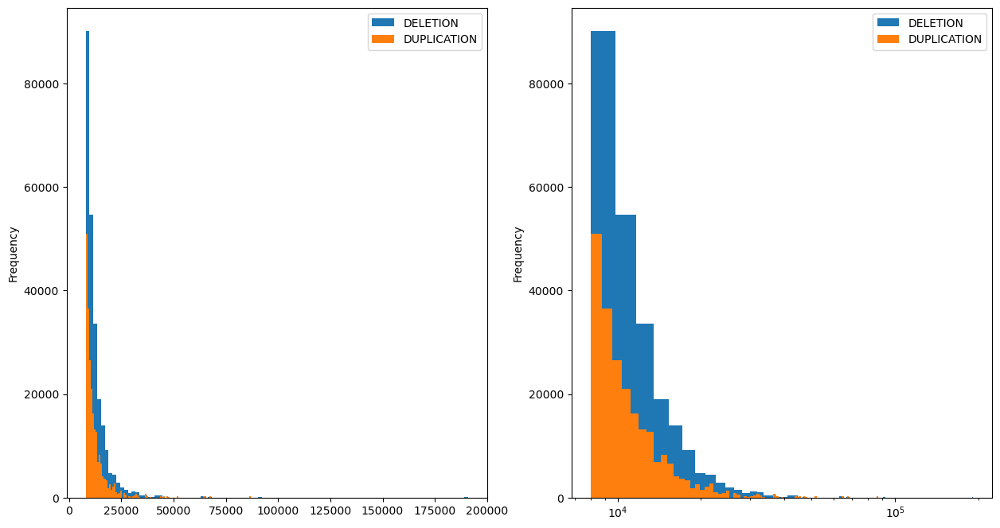

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [8]:
#subsetting deletions and duplications
deletions = chm13[chm13['TYPE'] =='DELETION']
duplications = chm13[chm13['TYPE'] == 'DUPLICATION']
deletions

biallelic_duplications = duplications[duplications['SCORE'] < 5 ] 
biallelic_duplications

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
961235,LP6005441-DNA_B02,chrX,12119426,12128395,3,DUPLICATION,8969
961243,LP6005441-DNA_B02,chrX,36927247,36935767,3,DUPLICATION,8520
961244,LP6005441-DNA_B02,chrX,36983761,36991872,3,DUPLICATION,8111
961248,LP6005441-DNA_B02,chrX,37359626,37379401,3,DUPLICATION,19775
961263,LP6005441-DNA_B02,chrX,45920595,45935886,3,DUPLICATION,15291
...,...,...,...,...,...,...,...
1874406,LP6005442-DNA_H01,chr1,244109432,244120542,3,DUPLICATION,11110
1874409,LP6005442-DNA_H01,chr1,246431276,246439465,3,DUPLICATION,8189
1874427,LP6005442-DNA_H01,chr1,247629795,247637933,4,DUPLICATION,8138
1874432,LP6005442-DNA_H01,chr1,247954331,247967419,4,DUPLICATION,13088


In [9]:
#change to df when using telomeres and centromeres filtration
cnv = chm13.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,102061,111943,12.0,15.0,11.0,14.0,15.0,12.0,11.0,...,15.0,13.0,14.0,14.0,14.0,12.0,15.0,11.0,13.0,16.0
1,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
2,chr1,613436,625116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
4,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10743,chrY,26436587,26458551,5.0,0.0,0.0,4.0,4.0,3.0,NaN,...,0.0,4.0,0.0,4.0,4.0,0.0,3.0,4.0,0.0,4.0
10744,chrY,26778516,26788355,4.0,0.0,0.0,3.0,3.0,4.0,NaN,...,0.0,3.0,0.0,4.0,4.0,0.0,3.0,3.0,0.0,4.0
10745,chrY,62325695,62345374,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10746,chrY,62345374,62363313,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
#change to df when using telomeres and centromeres filtration
final_cnv = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


#final_cnv = final_cnv.dropna(thresh=100)
final_cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
1,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
3,chr1,1199726,1209870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
4,chr1,1382671,1391067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8182,chrY,26436587,26458551,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN
8183,chrY,26778516,26788355,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN
8184,chrY,62325695,62345374,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8185,chrY,62345374,62363313,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,8177,8178,8179,8180,8181,8182,8183,8184,8185,8186
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,2.0
SS6004471,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [12]:
features = ids_hg19.set_index('SAMPLE').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['REGION', 'COUNTRY']]
features = features.sort_index()
features 

,REGION,COUNTRY
SAMPLE,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,America,Colombia
LP6005441-DNA_A05,WestEurasia,France
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo)
...,...,...
LP6007069-DNA_A01,WestEurasia,Greece
SS6004471,Africa,Congo
SS6004477,Oceania,Australia


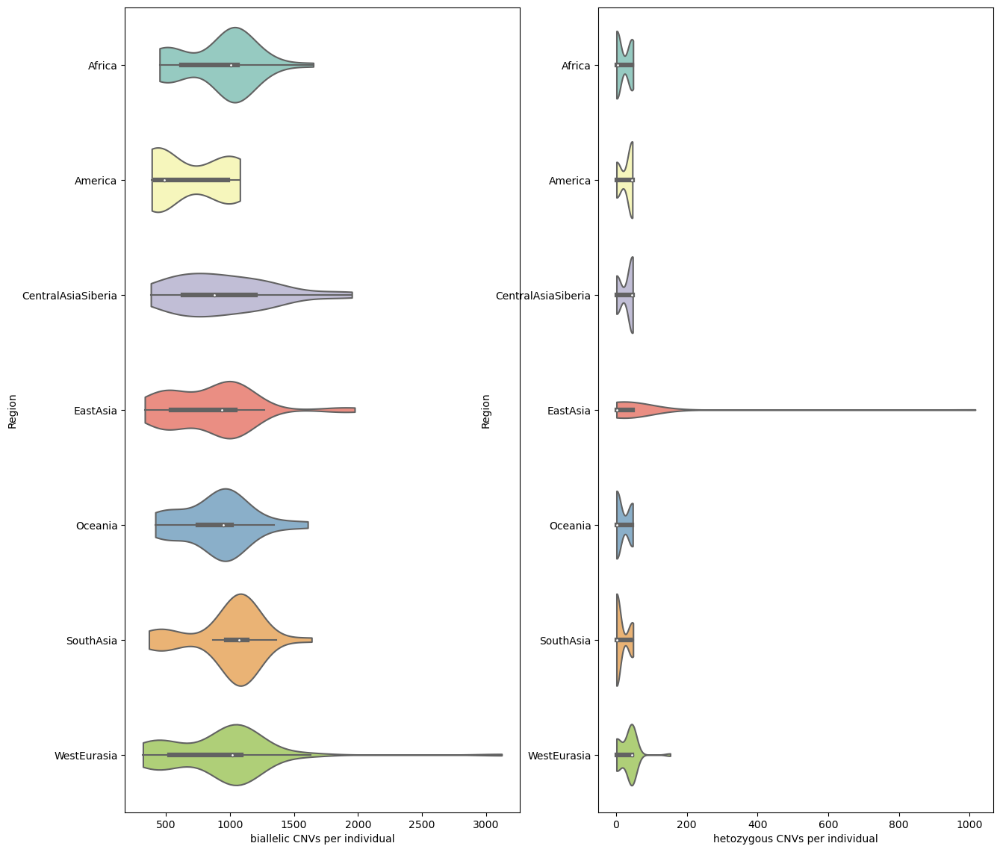

In [13]:
#import seaborn as sns

#pd.set_option("display.max_rows", None, "display.max_columns", None)
biallelic_deletions = deletions[deletions['SCORE'] < 2 ] 
biallelic_deletions = biallelic_deletions.groupby('SAMPLE').size()

biallelic_deletions = pd.DataFrame(biallelic_deletions)
#biallelic_deletions = biallelic_deletions.set_index('SAMPLE')

biallelic_deletions = features.merge(biallelic_deletions, left_index=True, right_index=True)
#biallelic_deletions = biallelic_deletions.reset_index()

#heterozygous_deletions.value_counts('SAMPLE').sort_index()
biallelic_deletions.columns = ['REGION', 'COUNTRY','TYPE']
biallelic_deletions


#pd.set_option("display.max_rows", None, "display.max_columns", None)
heterozygous_deletions = deletions[deletions['SCORE'] < 1] 
heterozygous_deletions = heterozygous_deletions.groupby('SAMPLE').size()
heterozygous_deletions = pd.DataFrame(heterozygous_deletions)
heterozygous_deletions = features.merge(heterozygous_deletions, left_index=True, right_index=True)
heterozygous_deletions.columns = ['REGION','COUNTRY', 'TYPE']
heterozygous_deletions
heterozygous_deletions


fig, axs = plt.subplots(1, 2, figsize=(15, 14))

ax = seaborn.violinplot(x="TYPE", y="REGION", data=biallelic_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[0], cut=0)

ax.set_xlabel("biallelic CNVs per individual")
ax.set_ylabel("Region")

ax = seaborn.violinplot(x="TYPE", y="REGION", data=heterozygous_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[1], cut=0)

ax.set_xlabel("hetozygous CNVs per individual")
ax.set_ylabel("Region")
plt.show()

In [14]:
#track features for pca & tsne
from sklearn import preprocessing

#X =preprocessing.scale(counts)

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,COUNTRY,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),-9.728542,-1.296218,-0.105812,-0.480084,-0.912164,1.049038,-0.974507,0.108363,0.143234,-0.844058
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,16.131562,1.278144,-0.739625,0.000081,-0.673528,1.405233,-0.872555,-0.052151,1.606645,0.699438
LP6005441-DNA_A04,America,Colombia,16.097766,-2.714843,0.667439,-0.305190,-0.501237,0.307583,-0.127683,0.392873,0.336962,-0.872461
LP6005441-DNA_A05,WestEurasia,France,-9.676231,-4.993266,0.711536,-0.696708,-0.562445,0.778692,1.834757,0.115308,-2.084641,0.431317
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),-9.863429,-4.716570,0.851307,-1.302474,-0.219132,0.591232,0.726289,-0.034182,-0.729834,-0.197752
...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,13.830281,6.005109,-1.734058,3.320691,15.631363,-3.451611,2.611307,-1.481931,-2.022380,-0.769044
SS6004471,Africa,Congo,-9.603699,5.770453,-0.663816,3.591533,16.790365,3.908361,1.530822,1.747432,3.116611,2.592156
SS6004477,Oceania,Australia,-9.619161,7.587067,-1.223747,2.697515,13.536972,3.531771,-0.613333,0.855070,3.950916,-0.599597


In [15]:
pca.explained_variance_ratio_

array([0.32232299, 0.0438211 , 0.02930827, 0.02362963, 0.01226472,
       0.00821693, 0.00676973, 0.00624589, 0.005909  , 0.00537554])

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -9.728542    -1.296218    -0.105812   
Oceania        PapuaNewGuinea    16.131562     1.278144    -0.739625   
America              Colombia    16.097766    -2.714843     0.667439   
WestEurasia            France    -9.676231    -4.993266     0.711536   
WestEurasia    Italy(Bergamo)    -9.863429    -4.716570     0.851307   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.830281     6.005109    -1.734058   
Africa                  Congo    -9.603699     5.770453    -0.663816   
Oceania             Australia    -9.619161     7.587067    -1.223747   
Oceania             Australia    15.282295     5.635296    -1.161997   
Africa                  Sudan    -9.742277     1.852122    -1.231996   

             component_4  component_5  component_6  component_7

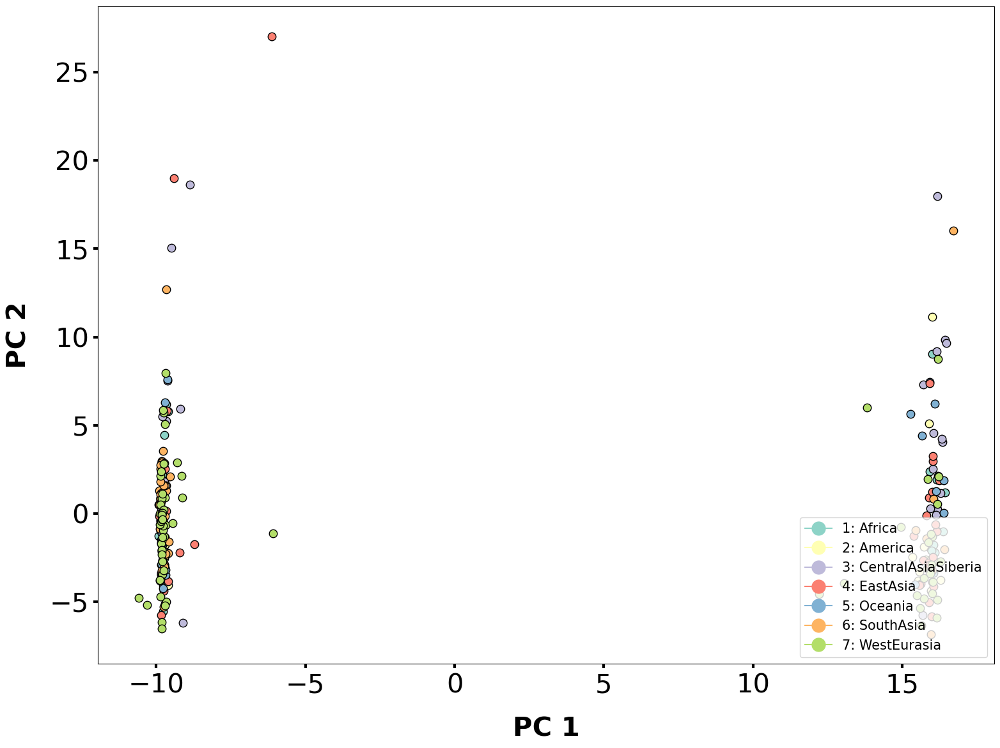

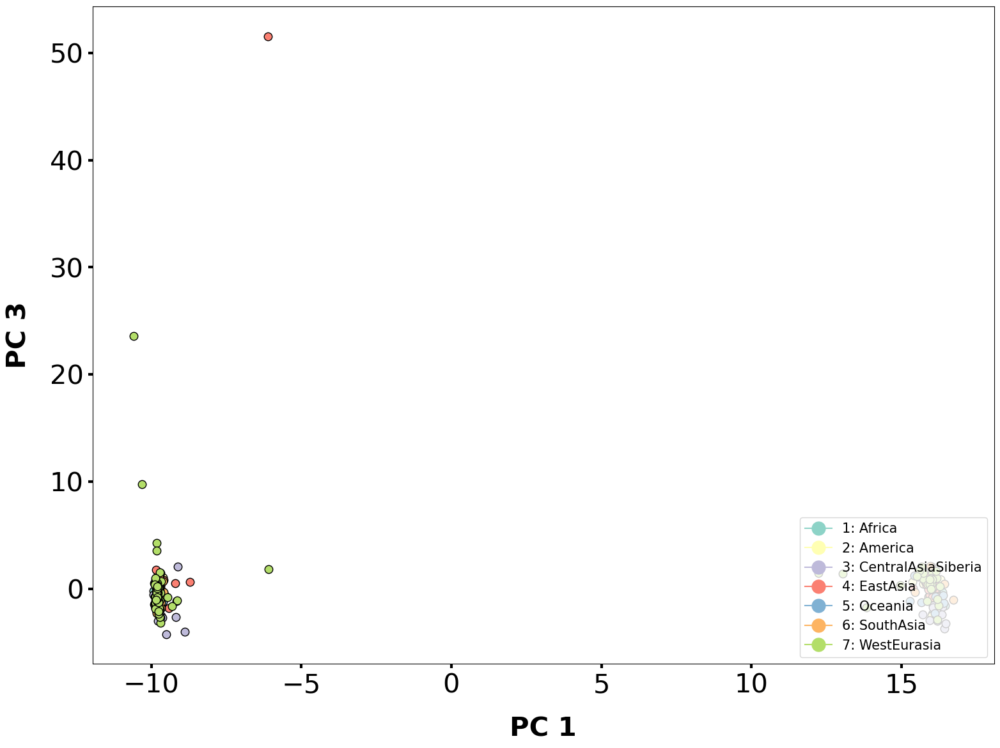

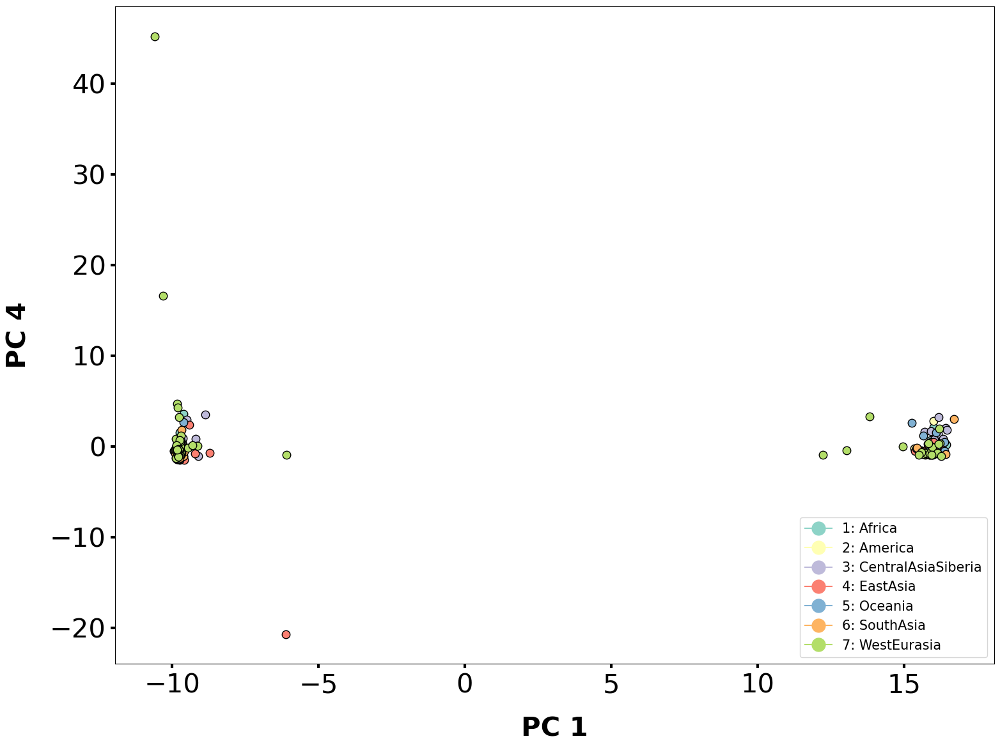

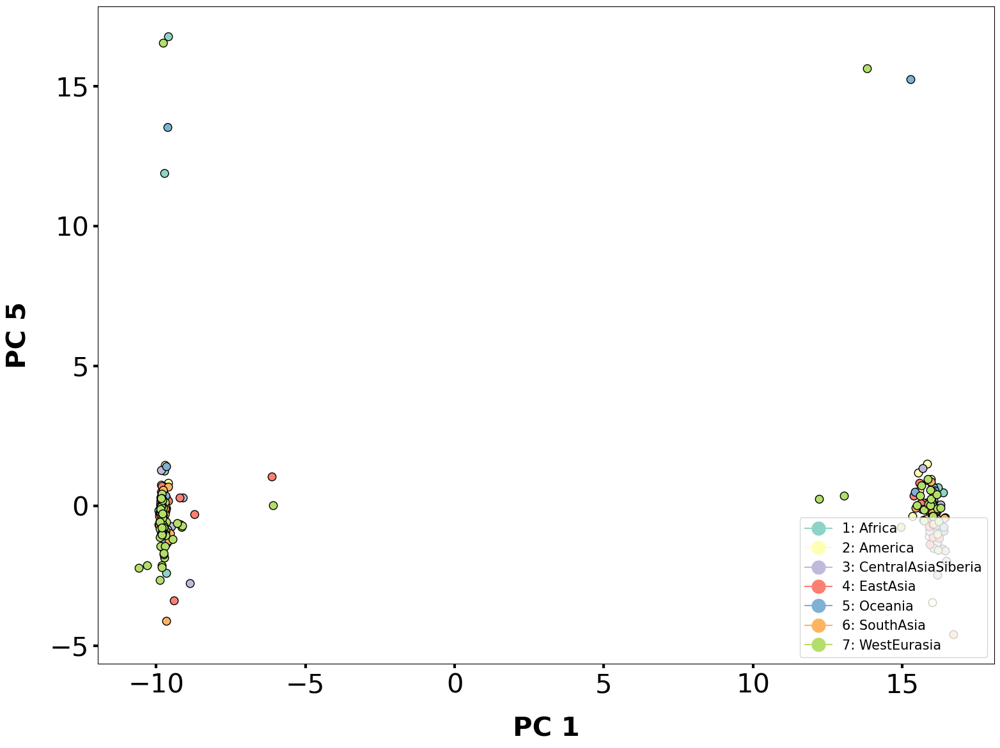

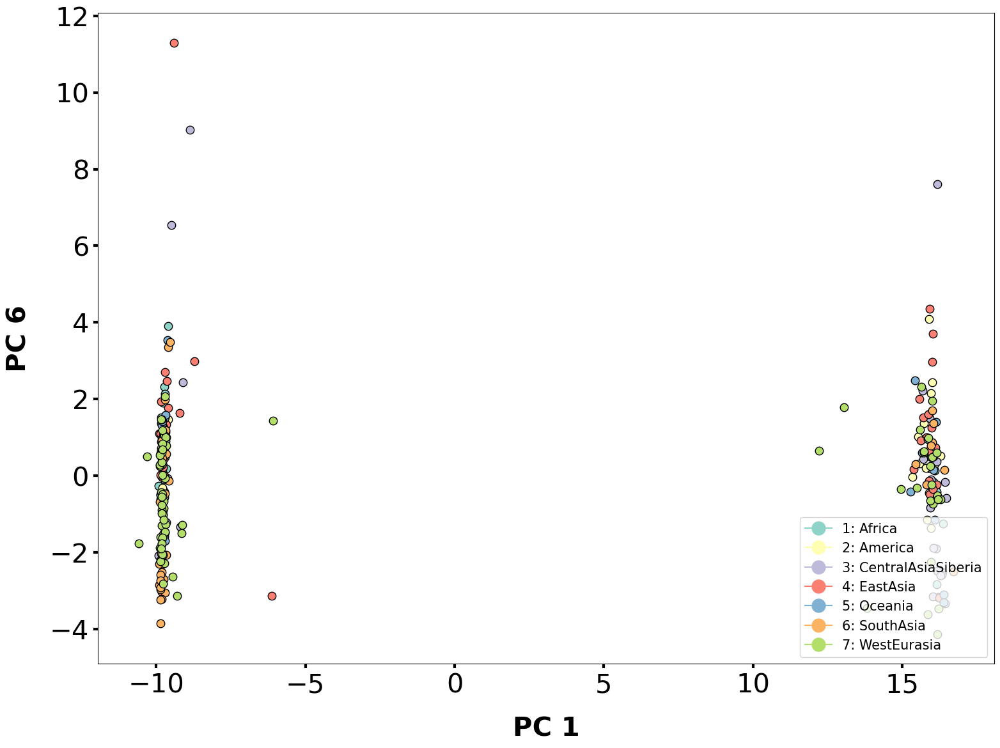

...

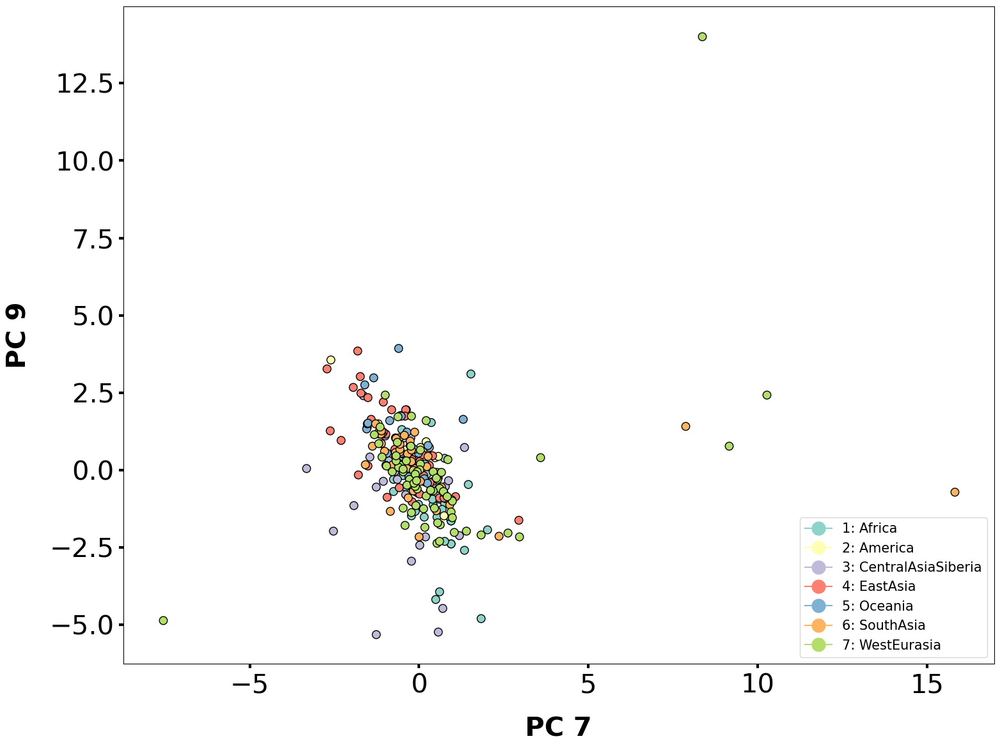

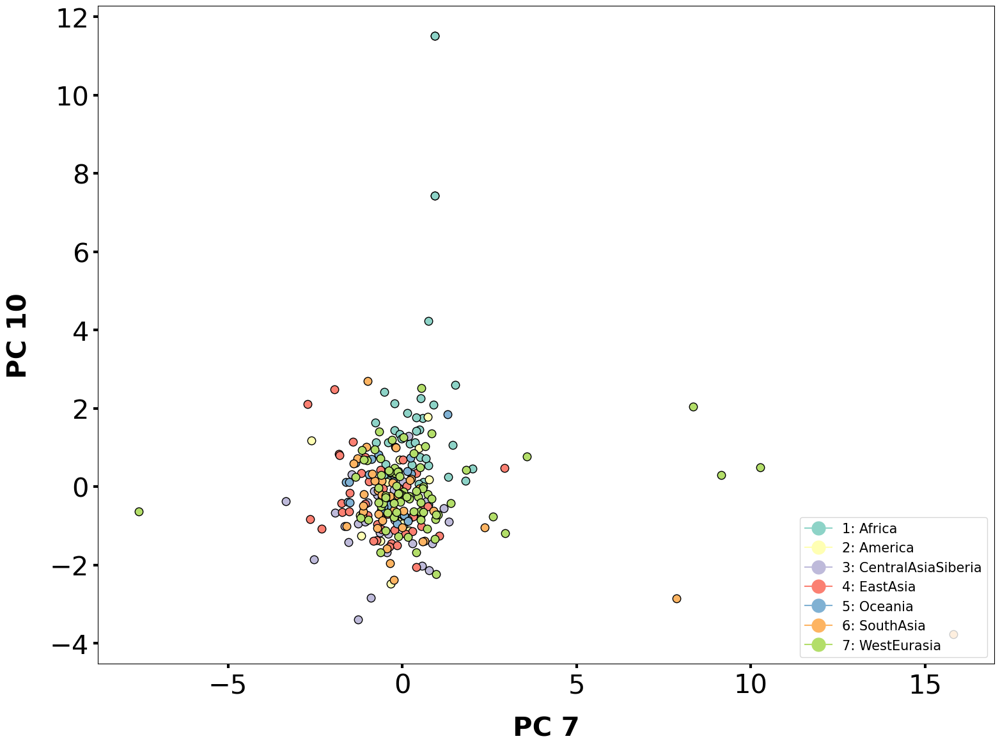

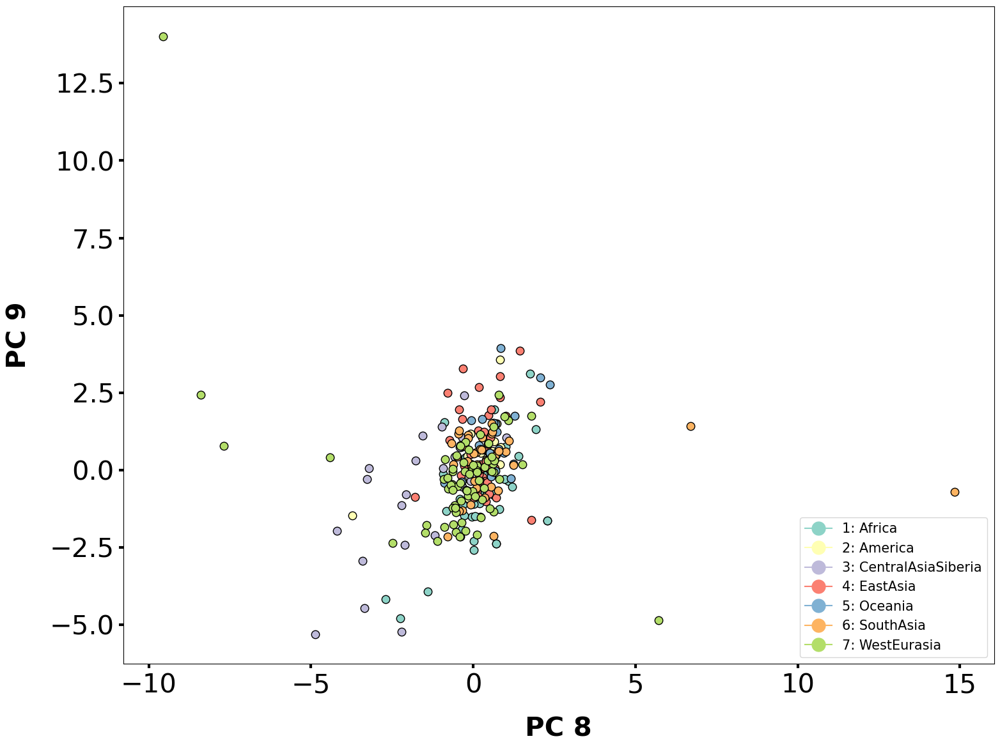

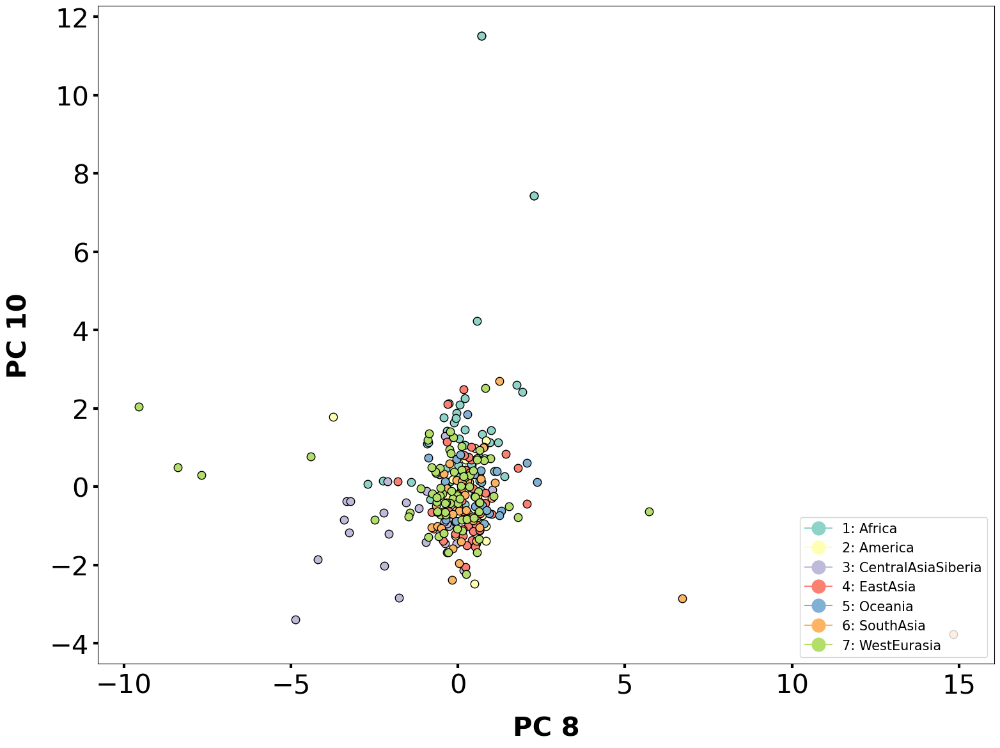

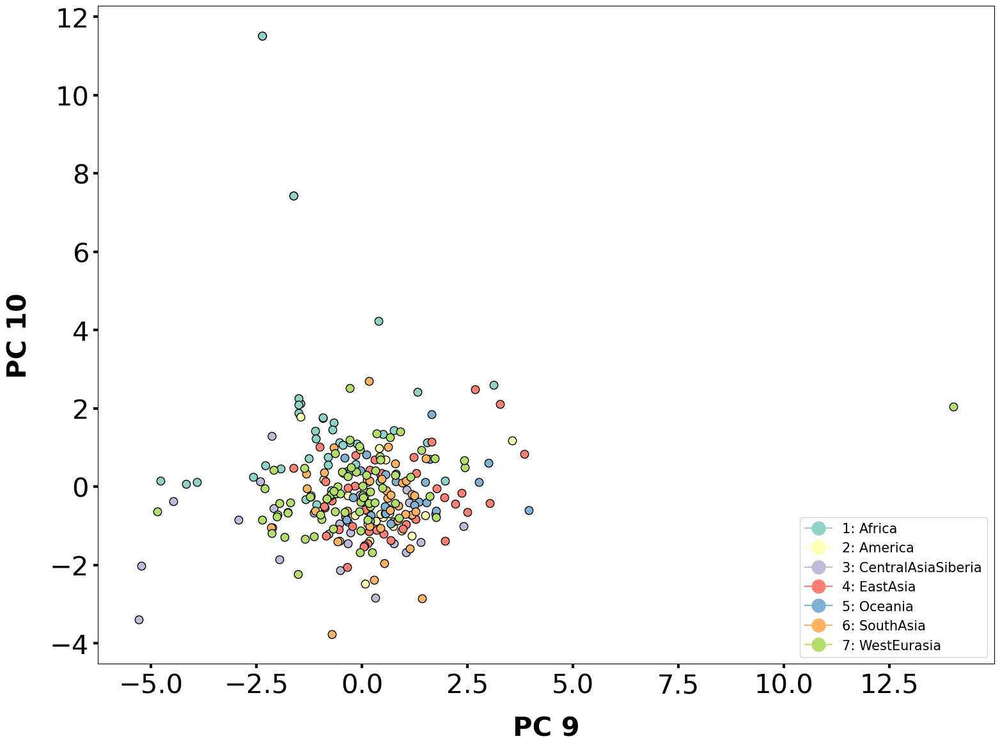

In [16]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

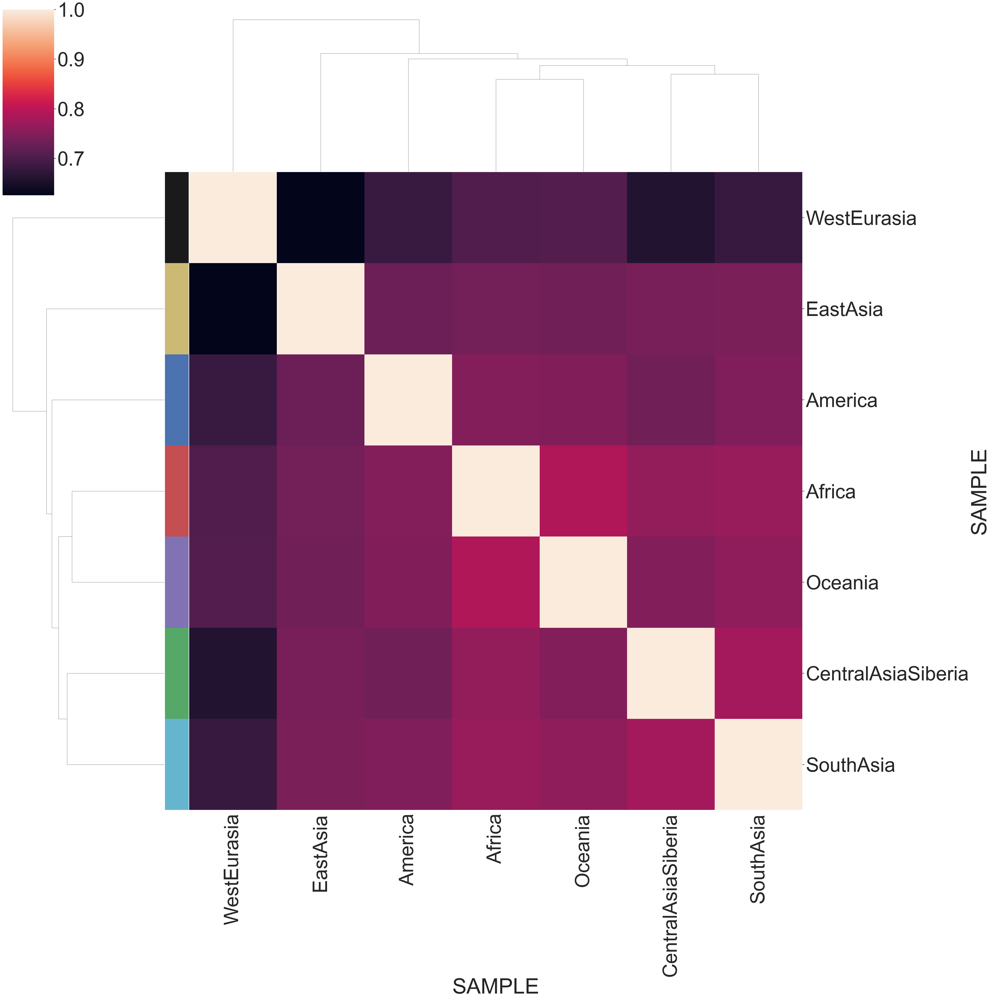

In [17]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=features['REGION'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='spearman')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))
#plt.savefig('clustermap_regions.pdf')

In [18]:
feature_table = pd.read_table('/branchinecta/jbazanwilliamson/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chromosome')
report = pd.read_table('/branchinecta/jbazanwilliamson/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

FileNotFoundError: [Errno 2] No such file or directory: '/branchinecta/jbazanwilliamson/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt'

In [32]:
chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
1,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
2,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,13463,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
3,gene,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
4,ncRNA,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236307,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236308,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236309,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449100,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236310,gene,transcribed_pseudogene,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62449384,62451910,-,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


<h1> Phylo

In [19]:
from Bio.Phylo.TreeConstruction import _Matrix
from Bio.Phylo.TreeConstruction import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
import scipy.stats

a = scipy.stats.zscore(counts, axis=1)
distances = pdist(np.array(a), metric='euclidean')
dist_matrix = squareform(distances)
dist_matrix.shape

dist_matrix

name =  list(counts.index)
matrix = dist_matrix
dist_matrix

array([[  0.        , 112.19325944, 111.47415944, ...,  80.29433472,
        115.50946032,  79.13034016],
       [112.19325944,   0.        ,  86.09364061, ..., 110.63406743,
         94.94953433, 114.72423144],
       [111.47415944,  86.09364061,   0.        , ..., 112.74954164,
         95.06704434, 114.7662127 ],
       ...,
       [ 80.29433472, 110.63406743, 112.74954164, ...,   0.        ,
        101.46482091,  77.60227832],
       [115.50946032,  94.94953433,  95.06704434, ..., 101.46482091,
          0.        , 105.56634077],
       [ 79.13034016, 114.72423144, 114.7662127 , ...,  77.60227832,
        105.56634077,   0.        ]])

In [20]:
lut = dict(zip(features['REGION'].unique(), "rbgymck"))

row_colors = features['REGION'].map(lut)
row_color = row_colors.to_dict()
lut

features

,REGION,COUNTRY
SAMPLE,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,America,Colombia
LP6005441-DNA_A05,WestEurasia,France
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo)
...,...,...
LP6007069-DNA_A01,WestEurasia,Greece
SS6004471,Africa,Congo
SS6004477,Oceania,Australia


In [21]:
from biotite.sequence.phylo import neighbor_joining
#track features for pca & tsne
#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.neighbor_joining(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))


#with open('newick_tree.tree', 'a') as f:
#    f.write(t)


(((((((((LP6005677-DNA_G01:35.561798095703125,LP6005443-DNA_C09:35.29170227050781):0.2708747386932373,LP6005442-DNA_A03:33.19390869140625):0.8448414206504822,LP6005441-DNA_E08:32.0118408203125):0.36954545974731445,((LP6005677-DNA_D01:33.088199615478516,(LP6005443-DNA_E09:30.588939666748047,LP6005443-DNA_A01:29.82244873046875):0.3365451693534851):0.2576475143432617,(LP6005443-DNA_E06:33.55488967895508,LP6005442-DNA_A11:31.513141632080078):2.1019678115844727):0.37157773971557617):0.13871672749519348,((LP6005443-DNA_F06:32.35394287109375,(LP6005442-DNA_G09:30.89543914794922,LP6005442-DNA_A08:30.01471710205078):0.7294837832450867):0.42273300886154175,((LP6005443-DNA_B02:30.501998901367188,LP6005441-DNA_G02:31.44796371459961):0.7777442336082458,(LP6005442-DNA_G10:33.014381408691406,LP6005442-DNA_A10:33.01811981201172):0.5949555039405823):0.12660054862499237):0.16439196467399597):0.036836910992860794,(((((((((LP6005677-DNA_E01:29.92431640625,LP6005443-DNA_F01:29.71918487548828):0.41043418645

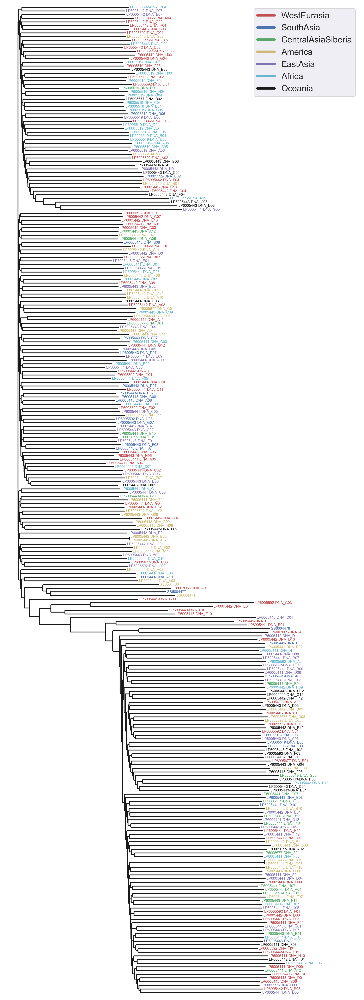

In [22]:
from Bio import Phylo
from io import StringIO 
import pylab
from matplotlib.lines import Line2D

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
    # set the size of the figure
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =0, prop={'size': 14})

#plt.savefig('neighbor-joining-tree_euclidean.png')

In [23]:
from biotite.sequence.phylo import upgma

#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.upgma(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))



((((((((SS6004480:37.87313461303711,LP6007068-DNA_A01:37.87313461303711):1.3934249877929688,(SS6004477:38.12808609008789,SS6004471:38.12808609008789):1.1384735107421875):1.2760467529296875,((((((((((((((LP6005677-DNA_G01:35.193294525146484,(((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((LP6005677-DNA_E01:29.82175064086914,LP6005443-DNA_F01:29.82175064086914):0.24442100524902344,((((((((LP6005592-DNA_H03:29.17831802368164,((LP6005443-DNA_F07:28.753286361694336,((LP6005443-DNA_D02:27.660436630249023,(LP6005441-DNA_C07:27.071521759033203,(LP6005441-DNA_C06:26.223451614379883,LP6005441-DNA_A06:26.223451614379883):0.8480701446533203):0.5889148712158203):0.6765594482421875,LP6005443-DNA_C02:28.33699607849121):0.416290283203125):0.2269458770751953,LP6005443-DNA_A07:28.98023223876953):0.19808578491210938):0.042934417724609375,LP6005443-DNA_H05:29.22125244140625):0.08448982238769531,(LP6005592-DNA_G01:28.828197479248047,(LP6005441-DNA_F05:28.345245361328125,LP6005441-

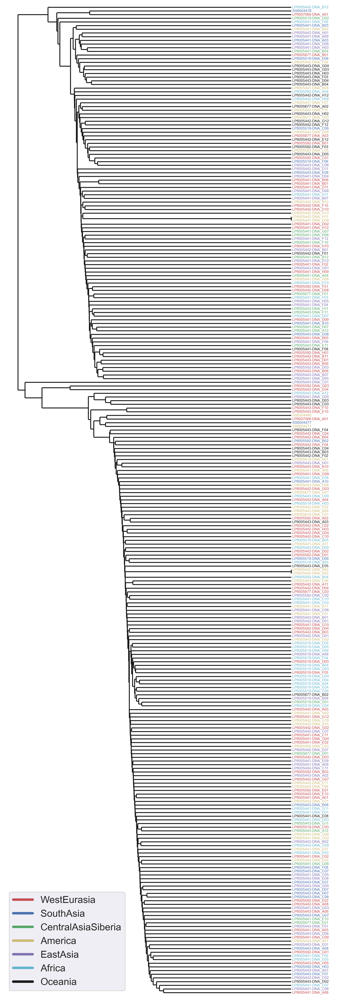

In [24]:
from Bio import Phylo
from io import StringIO 
from matplotlib.lines import Line2D
import pylab

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
#matplotlib.rc('font', size=6)
    # set the size of the figure
#fig = plt.figure(figsize=(20, 80), dpi=300)
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =3, prop={'size': 16})

#plt.savefig('upgma-tree_euclidean.png')
#plt.legend(row_color, loc ="upper left")
#plt.savefig('upgma-tree.pdf')
#Phylo.write(tree_2, "egfr-family-annotated.xml", "phyloxml")

In [25]:
deletions

,SAMPLE,CHR,START,END,SCORE,TYPE,LENGHT
0,LP6005441-DNA_B02,chrX,105118,116978,1,DELETION,11860
18,LP6005441-DNA_B02,chrX,1038532,1048096,1,DELETION,9564
21,LP6005441-DNA_B02,chrX,1193541,1202443,1,DELETION,8902
24,LP6005441-DNA_B02,chrX,1296349,1304923,1,DELETION,8574
26,LP6005441-DNA_B02,chrX,1855267,1863572,1,DELETION,8305
...,...,...,...,...,...,...,...
961216,LP6005442-DNA_H01,chrY,25831552,25849672,0,DELETION,18120
961218,LP6005442-DNA_H01,chrY,25849672,25870481,0,DELETION,20809
961223,LP6005442-DNA_H01,chrY,25870481,25903787,0,DELETION,33306
961225,LP6005442-DNA_H01,chrY,26436587,26458551,0,DELETION,21964


<h1> Vst

In [26]:
#change to df when using telomeres and centromeres filtration
input_vst = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


input_vst

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,521722,540598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0
1,chr1,839350,851555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chr1,1041679,1050074,NaN,NaN,1.0,1.0,NaN,1.0,NaN,...,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN
3,chr1,1199726,1209870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
4,chr1,1382671,1391067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8182,chrY,26436587,26458551,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN
8183,chrY,26778516,26788355,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN
8184,chrY,62325695,62345374,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8185,chrY,62345374,62363313,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
coordinates = input_vst.iloc[:,0:2]
cnvs = input_vst.iloc[:,3:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,8177,8178,8179,8180,8181,8182,8183,8184,8185,8186
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,2.0
SS6004471,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [28]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,REGION,COUNTRY,0,1,2,3,4,5,6,7,...,8177,8178,8179,8180,8181,8182,8183,8184,8185,8186
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A04,America,Colombia,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0
LP6005441-DNA_A05,WestEurasia,France,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,2.0
SS6004471,Africa,Congo,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,Oceania,Australia,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [29]:
####### Groupby regions #######
dt_group = dt.groupby('REGION')

dt_groupped = []
regions = features['REGION'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['REGION'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [30]:
## VST for pair-population

from vst_function import *
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt

/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  ret

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).v

,0,1,2,3,4,5,6,7,8,9,...,8177,8178,8179,8180,8181,8182,8183,8184,8185,8186
WestEurasia-Oceania,0.051059,0.017159,0.032919,0.016361,0.026963,NaN,NaN,0.010959,0.010593,0.024893,...,0.010436,0.011166,0.010312,0.010330,0.010332,0.011166,0.011166,0.013699,0.013699,0.017159
WestEurasia-America,0.011290,0.032138,0.011314,0.018279,0.015938,NaN,NaN,0.022934,0.029389,0.016709,...,0.062211,0.076111,0.064419,0.059238,0.060131,0.076111,0.076111,0.013699,0.013699,0.016709
WestEurasia-Africa,0.026284,0.031311,0.009836,0.011288,0.012066,NaN,0.040287,0.008938,0.008989,0.011855,...,0.013419,0.009434,0.012495,0.012414,0.011798,0.009434,0.009434,0.013699,0.013699,0.018713
WestEurasia-EastAsia,0.008431,0.019084,0.016229,0.009532,0.008846,NaN,0.021739,0.018175,0.018227,0.010275,...,0.013956,0.016925,0.015009,0.020735,0.016443,0.016925,0.016925,0.009323,0.009323,0.008710
WestEurasia-SouthAsia,0.009650,0.013099,0.031034,0.033256,0.009065,0.043940,0.026316,0.017507,0.051757,0.018474,...,0.041497,0.027601,0.038882,0.031054,0.037636,0.027601,0.027601,0.013699,0.011016,0.009019
WestEurasia-CentralAsiaSiberia,0.026437,0.021071,0.026242,0.026437,0.011155,NaN,NaN,0.019506,0.016455,0.017473,...,0.070584,0.060467,0.073194,0.079104,0.078852,0.060467,0.060467,0.013699,0.013699,0.017473
Oceania-America,0.058375,0.078571,0.068333,0.059375,0.083034,NaN,NaN,0.041667,0.058375,0.061508,...,0.086828,0.096023,0.096023,0.085901,0.084744,0.096023,0.096023,NaN,NaN,NaN
Oceania-Africa,0.022490,0.053179,0.035647,0.016585,0.025474,NaN,0.033682,0.015648,0.016513,0.020125,...,0.021778,0.018821,0.018821,0.019626,0.018821,0.018821,0.018821,NaN,NaN,NaN
Oceania-EastAsia,0.063124,NaN,0.022091,0.028340,0.041079,NaN,0.021739,0.027018,0.028061,0.020833,...,0.017764,0.017557,0.020494,0.024267,0.020494,0.017557,0.017557,0.021739,0.021739,0.021739
Oceania-SouthAsia,0.076120,0.036842,0.112390,0.021033,0.037718,0.036842,0.026316,0.028863,0.076120,0.068056,...,0.056498,0.047859,0.047859,0.041309,0.047859,0.047859,0.047859,NaN,0.026316,0.026316


In [31]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst

,26,31,61,63,81,100,101,157,167,220,...,8171,8172,8174,8175,8177,8178,8179,8181,8182,8183
WestEurasia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,True,False,False,True,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [32]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['CHR'])
vst_dt.insert (1, 'start', cnv['START'])
vst_dt.insert (2, 'end', cnv['END'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
0,chr1,102061,111943,0.05106,0.01129,0.02628,0.00843,0.00965,0.02644,0.05837,...,0.02602,0.01610,0.02000,0.03295,0.03112,0.03811,0.01472,0.01236,0.03382,0.04249
1,chr1,521722,540598,0.01716,0.03214,0.03131,0.01908,0.01310,0.02107,0.07857,...,0.01641,0.08594,0.02500,0.02334,0.06494,0.01975,0.01632,0.04108,0.06103,0.01729
2,chr1,613436,625116,0.03292,0.01131,0.00984,0.01623,0.03103,0.02624,0.06833,...,0.01992,0.02805,0.03106,0.03323,0.01485,0.04769,0.04425,0.07140,0.06552,0.01557
3,chr1,839350,851555,0.01636,0.01828,0.01129,0.00953,0.03326,0.02644,0.05937,...,0.03734,0.01996,0.07370,0.07632,0.01894,0.02436,0.02212,0.04934,0.04295,0.01581
4,chr1,1041679,1050074,0.02696,0.01594,0.01207,0.00885,0.00906,0.01116,0.08303,...,0.03636,0.01858,0.02517,0.03619,0.01815,0.01548,0.01517,0.01275,0.01698,0.01631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8182,chr6,65384421,65392649,0.01117,0.07611,0.00943,0.01693,0.02760,0.06047,0.09602,...,0.11463,0.05369,0.20290,0.02461,0.02599,0.02700,0.08791,0.06730,0.03660,0.16525
8183,chr6,65441699,65459644,0.01117,0.07611,0.00943,0.01693,0.02760,0.06047,0.09602,...,0.11463,0.05369,0.20290,0.02461,0.02599,0.02700,0.08791,0.06730,0.03660,0.16525
8184,chr6,65476242,65501620,0.01370,0.01370,0.01370,0.00932,0.01370,0.01370,0.00000,...,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.02174,0.00000
8185,chr6,65521175,65530231,0.01370,0.01370,0.01370,0.00932,0.01102,0.01370,0.00000,...,0.00000,0.02174,0.02632,0.00000,0.02174,0.02632,0.00000,0.01213,0.02174,0.02632


In [35]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.columns]
cnv_passed_vst
#deletions = cnv_passed_vst[cnv_passed_vst.isin([0]).any(axis=1)]
#deletions = cnv_passed_vst[cnv_passed_vst.isin([1]).any(axis=1)]
#deletions = cnv_passed_vst[cnv_passed_vst.isin([2]).any(axis=1)]

#duplications = cnv_passed_vst[cnv_passed_vst.isin([2]).any(axis=1)]
#duplications = cnv_passed_vst[~cnv_passed_vst.isin([3]).any(axis=1)]
#duplications = cnv_passed_vst[~cnv_passed_vst.isin([4]).any(axis=1)]
#duplications

SAMPLE,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
26,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0
31,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0
61,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
63,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0
81,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8178,2.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,...,0.0,2.0,0.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
8179,2.0,0.0,0.0,2.0,2.0,2.0,1.0,2.0,2.0,0.0,...,0.0,2.0,0.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
8181,2.0,0.0,0.0,2.0,2.0,2.0,1.0,2.0,2.0,0.0,...,0.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,0.0,2.0
8182,2.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,...,0.0,2.0,0.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0


In [36]:
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,26,31,61,63,81,100,101,157,167,220,...,8171,8172,8174,8175,8177,8178,8179,8181,8182,8183
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
SS6004471,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [37]:
#track features for pca & tsne
from sklearn import preprocessing

#X =preprocessing.scale(counts)

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,COUNTRY,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,Russia(Caucasus),-8.776776,-0.557560,1.063388,-0.351001,-0.142831,-0.618940,1.081915,-0.194893,-0.176601,-0.285151
LP6005441-DNA_A03,Oceania,PapuaNewGuinea,14.483085,-0.057586,0.369088,-0.741052,-0.733848,0.213243,0.895442,-0.681135,-0.352533,0.681633
LP6005441-DNA_A04,America,Colombia,14.659472,-1.740502,0.749189,-0.479644,-0.646505,-0.324159,0.482549,-1.091292,0.124286,-0.272458
LP6005441-DNA_A05,WestEurasia,France,-8.782842,-2.079116,-0.908937,0.111038,-0.080064,-0.568960,0.310089,-0.263412,-0.727972,-0.250340
LP6005441-DNA_A06,WestEurasia,Italy(Bergamo),-8.875954,-2.039613,-0.930109,0.310834,-0.456421,0.412913,-0.219572,0.326156,-0.046237,-0.412459
...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,Greece,13.126232,1.854468,-0.233234,-1.146808,2.009344,3.037960,-0.577631,1.359850,1.780966,-1.073663
SS6004471,Africa,Congo,-8.866181,2.254159,-1.364244,0.068599,1.413093,1.567603,0.571812,2.726233,1.090189,1.511169
SS6004477,Oceania,Australia,-8.831884,2.982601,0.800303,-0.899106,1.147032,1.686781,0.274782,2.033151,0.368779,-0.349866


                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

                      COUNTRY  component_1  component_2  component_3  \
REGION                                                                 
WestEurasia  Russia(Caucasus)    -8.776776    -0.557560     1.063388   
Oceania        PapuaNewGuinea    14.483085    -0.057586     0.369088   
America              Colombia    14.659472    -1.740502     0.749189   
WestEurasia            France    -8.782842    -2.079116    -0.908937   
WestEurasia    Italy(Bergamo)    -8.875954    -2.039613    -0.930109   
...                       ...          ...          ...          ...   
WestEurasia            Greece    13.126232     1.854468    -0.233234   
Africa                  Congo    -8.866181     2.254159    -1.364244   
Oceania             Australia    -8.831884     2.982601     0.800303   
Oceania             Australia    13.971979     0.774701     0.331657   
Africa                  Sudan    -8.866650     0.791167    -0.594955   

             component_4  component_5  component_6  component_7

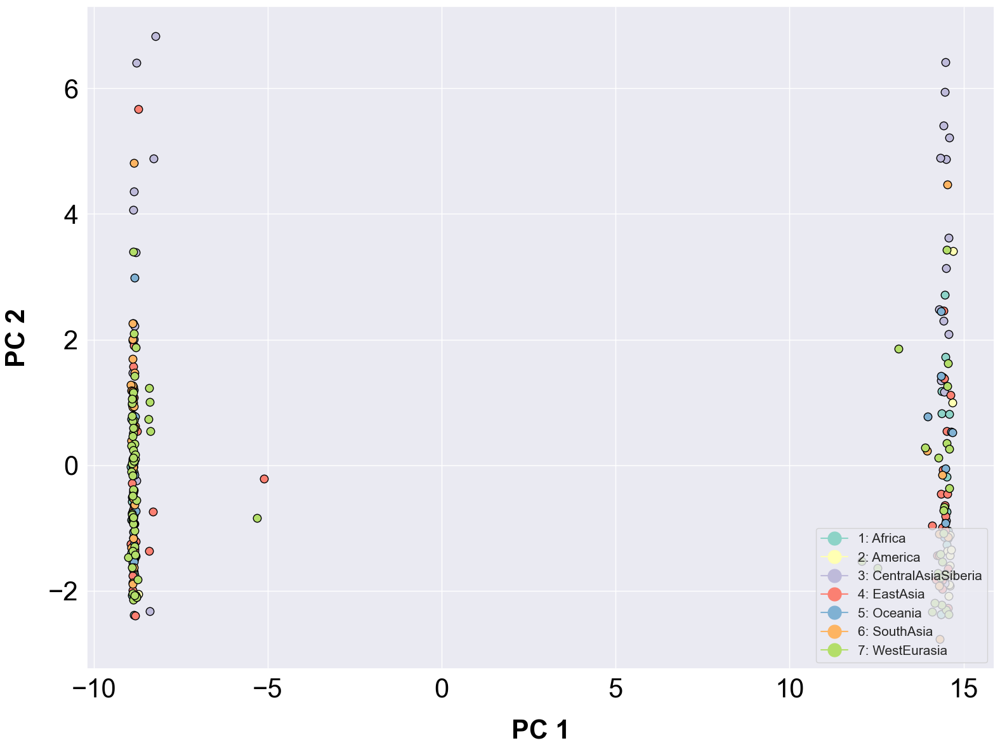

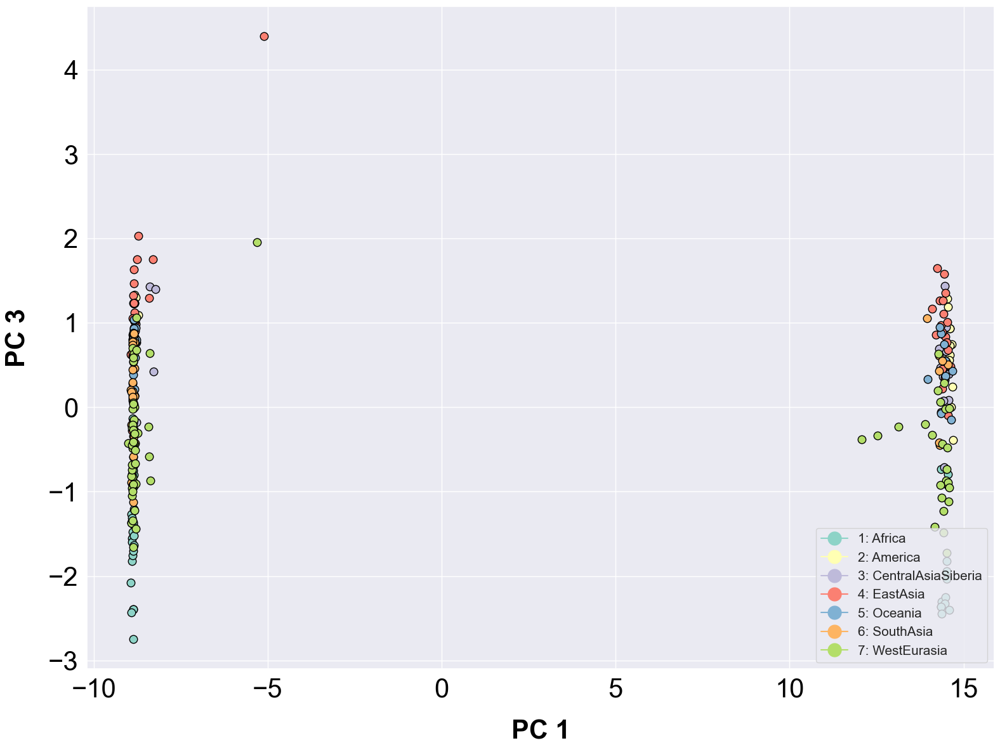

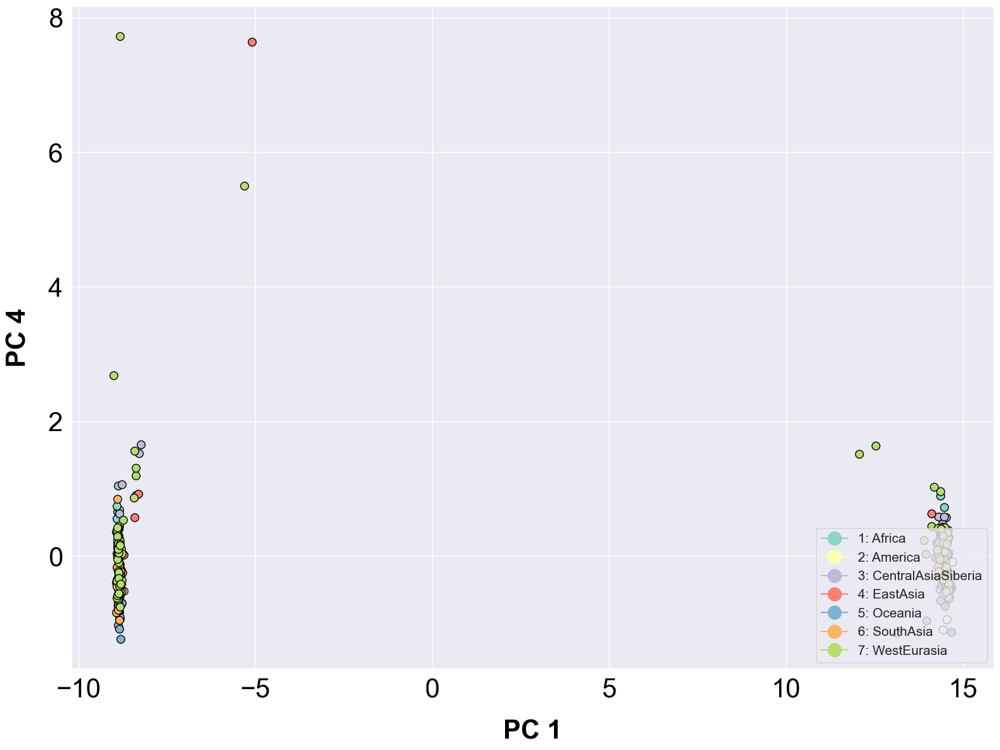

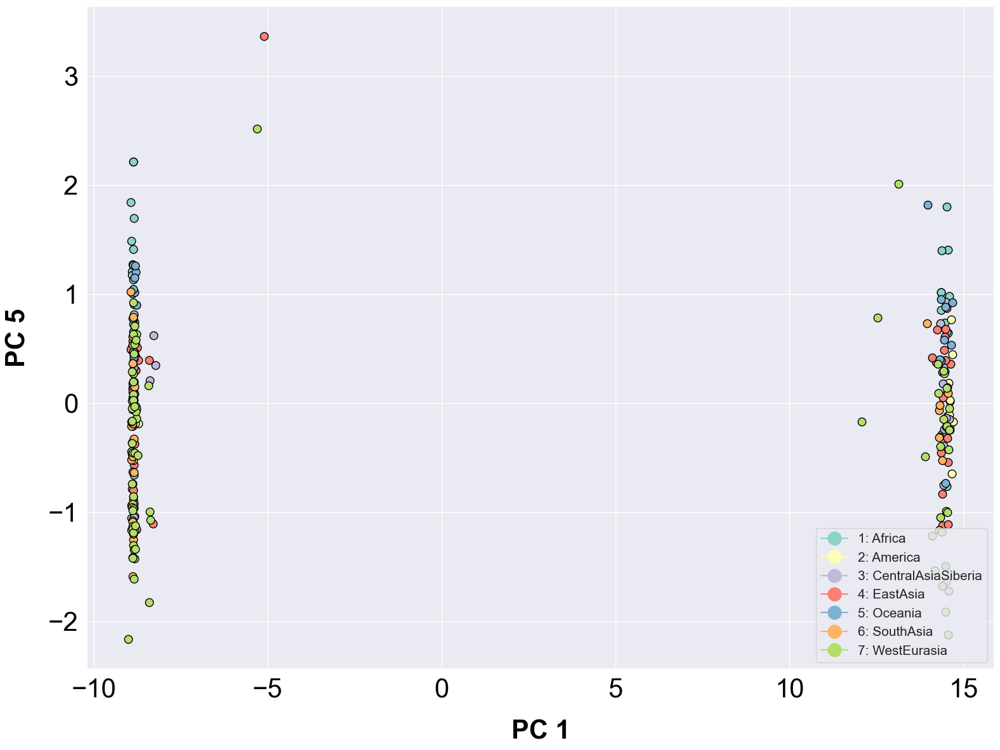

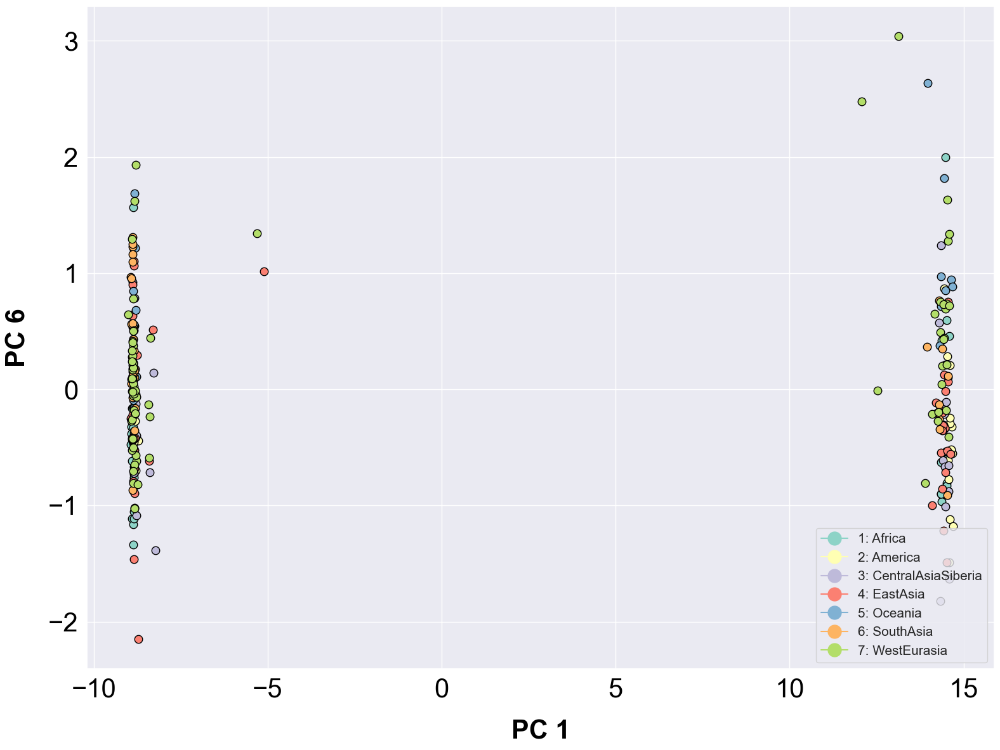

...

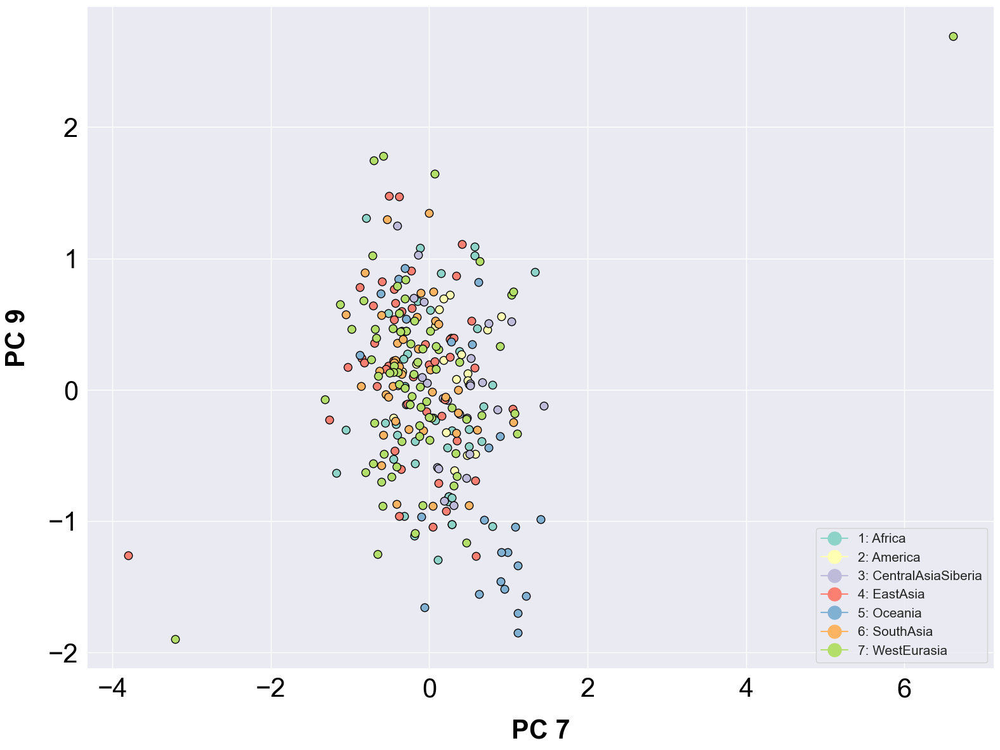

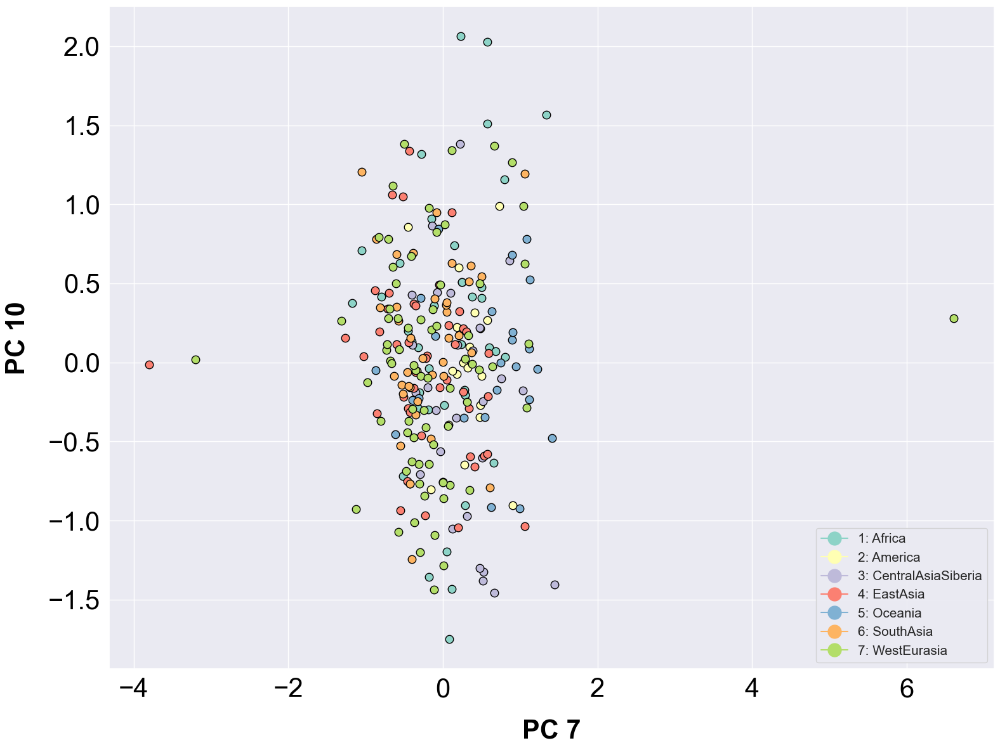

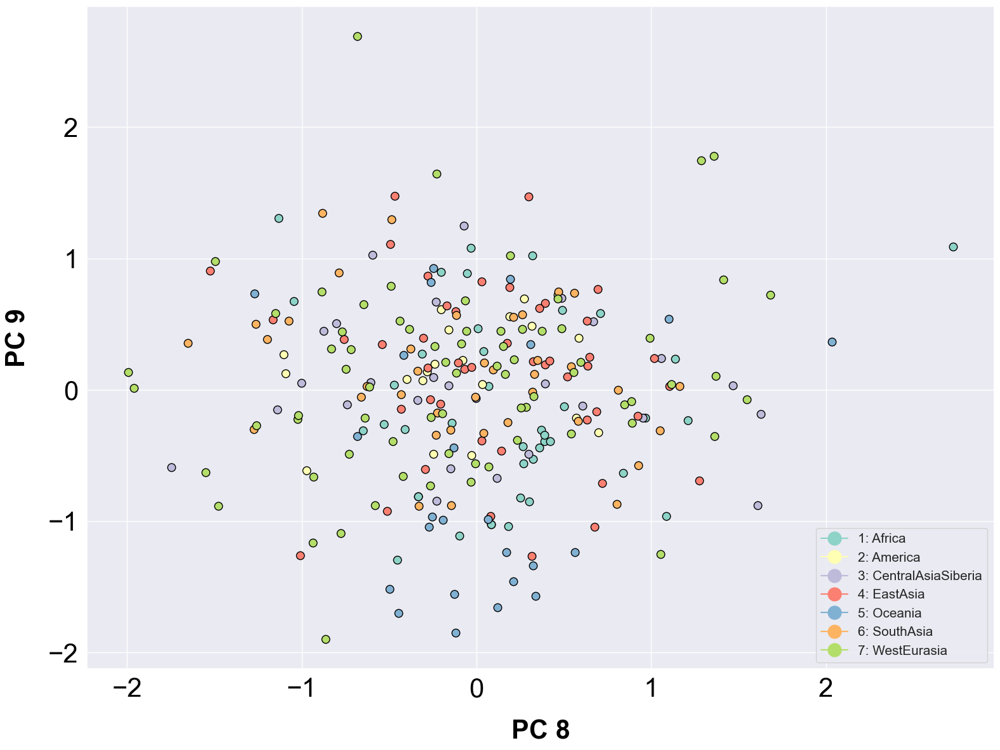

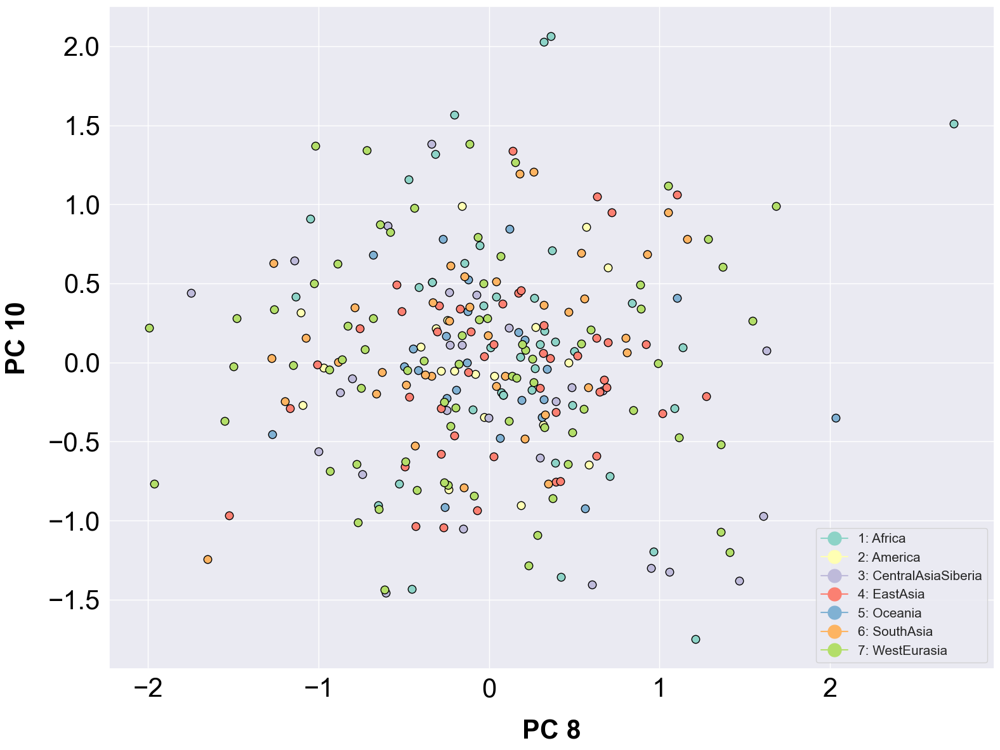

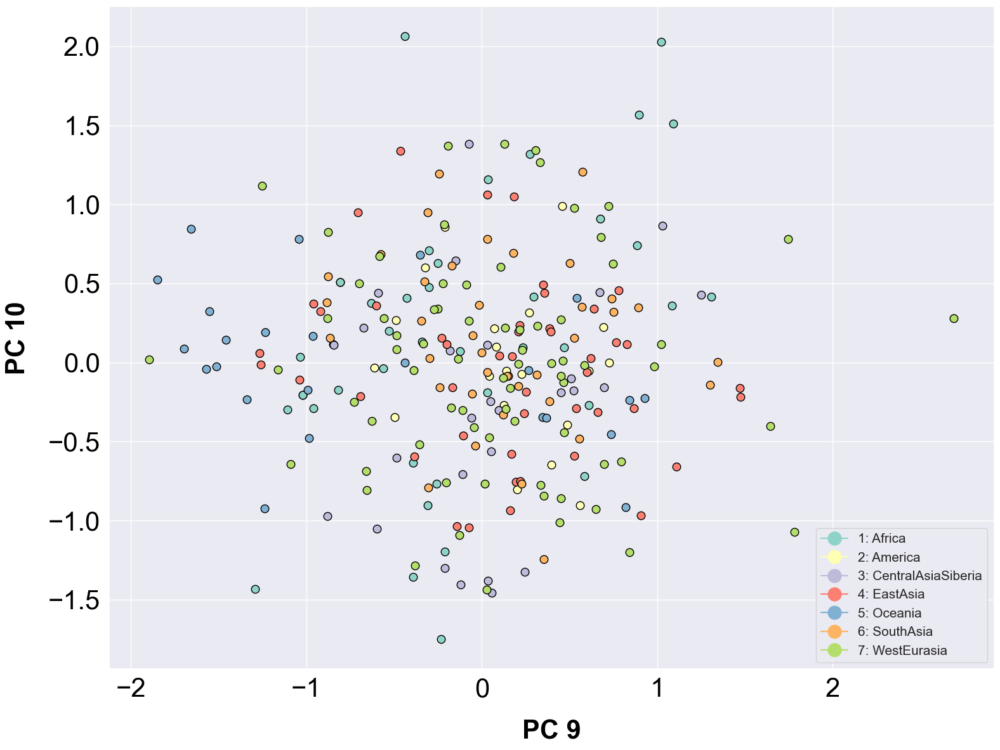

In [38]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    
    

In [41]:
pca.explained_variance_ratio_

array([0.8201092 , 0.02236552, 0.00694466, 0.00556836, 0.0049068 ,
       0.0037541 , 0.00359002, 0.00336152, 0.00316692, 0.00276674])

In [39]:
#cnv_passed_vst.reset_index()
cnv_passed_vst_melted = pd.melt(cnv_passed_vst, value_vars=cnv_passed_vst.columns)
cnv_passed_vst_melted

,SAMPLE,value
0,LP6005441-DNA_A01,2.0
1,LP6005441-DNA_A01,1.0
2,LP6005441-DNA_A01,2.0
3,LP6005441-DNA_A01,2.0
4,LP6005441-DNA_A01,2.0
...,...,...
171348,SS6004480,2.0
171349,SS6004480,2.0
171350,SS6004480,2.0
171351,SS6004480,2.0


In [44]:
np.median

<function numpy.median(a, axis=None, out=None, overwrite_input=False, keepdims=False)>